# 01 · Ultrasound Meets 3D Printing — Listening to a Part Being Born

**IUM teaching series, Notebook 1/4** · based on: Wang, Y., & Zhao, X. (2026).
*Machine learning-aided in-situ ultrasonic characterization for multi-parametric
monitoring of vat photopolymerization.* **Additive Manufacturing**, 105300.
[doi:10.1016/j.addma.2026.105300](https://doi.org/10.1016/j.addma.2026.105300)

## Why this matters

Vat photopolymerization (VPP/DLP) prints polymer parts layer by layer with
projected light — fast and precise, but **blind**: the three states that decide
part quality (degree of conversion, storage modulus, thickness) are invisible
during the build and are normally measured only *after* printing, destructively.

This series shows how a **10 MHz ultrasonic transducer embedded in the printhead**
turns the printer into its own sensor. In this notebook you will:

1. load real ultrasonic A-scans recorded *during* printing;
2. learn to read the echoes (B1 / B2 / B3);
3. watch the part grow — literally — through waveform animations;
4. extract your first physical measurement: the **time of flight (ToF)**.

![system](https://raw.githubusercontent.com/wangyiquan1010-coder/IUM_teaching_colab/main/figs/system_overview.png)
*The DLP-IUM platform: the Rexolite printhead doubles as the transducer's delay
line, so the part is monitored continuously without interrupting printing.*


## Key terms before we start

If you have never worked with ultrasound, these five words are all you need:

| term | meaning in this notebook |
|---|---|
| **A-scan** | one recorded waveform: amplitude versus time, from a single ultrasonic pulse. Here each A-scan has 62,509 points sampled at 2.5 GHz, i.e. one point every **0.4 ns**, covering ~25 µs. |
| **frame** | one A-scan captured at one moment. We record **6 frames per printed layer**: a reference before the light turns on, then five during the 15 s exposure (3 s apart). |
| **echo (B1, B2, B3)** | a reflected pulse returning from an interface. B1 comes back from the printhead's own bottom face, B2 from the bottom of the resin vat after travelling through the part, B3 is the same trip made twice. |
| **ToF (time of flight)** | the time between two echoes, here B1 → B2, in microseconds. It is our first physical measurement: it grows as the part grows and shrinks as the material cures and becomes faster. |
| **round trip** | the pulse goes *down and back*, so a ToF of 1 µs corresponds to **twice** the physical path. Always divide by 2 before converting ToF into a distance. |


### Before we run anything: the setup cell

**Input** — nothing from your side. On Google Colab this cell downloads the
course repository (`github.com/wangyiquan1010-coder/IUM_teaching_colab`), which
ships *all* the data used in this series; running locally, it just finds the
repository folder you already have.

**What this cell does** — clones the repo if needed, moves the working
directory to the repository root (so that every later path like
`data/feature11.csv` resolves), and imports the four things we use everywhere:
`numpy` (signal math), `pandas` (tables), `matplotlib` (plots) and
`ium_utils` — **our own teaching library**, a clean, read-only refactor of the
paper's code that lives in `src/ium_utils.py`. Feel free to open that file at
any point: every function used in the notebooks is defined there, with comments.

**Output** — the imported modules plus a confirmation line printing the
repository root. Nothing is computed yet.


In [1]:
# --- Setup (works both locally and on Google Colab) ---------------------------
# On Colab the notebook starts in an empty machine, so we first download
# ("clone") the whole course repository, which contains the data, the helper
# library and the figures. Locally the files are already next to the notebook,
# so the clone is skipped.
import os, sys

if "google.colab" in sys.modules and not os.path.exists("src"):
    !git clone -q https://github.com/wangyiquan1010-coder/IUM_teaching_colab.git
    %cd IUM_teaching_colab

# Walk up the folder tree until we find the repository root (the folder that
# contains src/). This makes every later path such as "data/feature11.csv"
# work no matter where the notebook was launched from.
_here = os.getcwd()
while not os.path.isdir(os.path.join(_here, "src")):
    _parent = os.path.dirname(_here)
    if _parent == _here:
        raise FileNotFoundError("repo root with src/ not found")
    _here = _parent
os.chdir(_here)
sys.path.insert(0, "src")            # so that "import ium_utils" works

import numpy as np                   # arrays / signal math
import pandas as pd                  # tables (features, labels, results)
import matplotlib.pyplot as plt      # static plots
from matplotlib import rc
rc("animation", html="jshtml")       # render animations as interactive players
import ium_utils as iu               # OUR course library (see src/ium_utils.py)
print("setup ok — repo root:", _here)


setup ok — repo root: C:\Users\wangy\Desktop\IUM_teaching_colab


## 1. The data — where the waveforms come from

The paper's dataset contains 50 printed cylinders (5 layer counts × 10 exposure
intensities). Shipping every raw waveform would be hundreds of megabytes, so
this course repository carries **three representative prints**, already
converted from the original oscilloscope CSV files into compressed `.npz`
archives (see `tools/extract_teaching_data.py` and `DATA_CARD.md` for the exact
provenance — the original dataset was never modified).

| file | layers | exposure intensity |
|---|---|---|
| `waveforms_15L_I1.npz` | 15 | I1 = 10.70 mW/cm² (weak cure) |
| `waveforms_15L_I7.npz` | 15 | I7 = 20.16 mW/cm² (strong cure) |
| `waveforms_30L_I7.npz` | 30 | I7 = 20.16 mW/cm² |

Two of them are printed with the **same geometry but different light intensity**
(15L @ I1 vs 15L @ I7) — that pair is our controlled comparison throughout the
notebook. The third is a taller print used for the growth animations.

---

**Input** — the three `.npz` files in `data/`. Each archive stores one array per
printed layer plus a small JSON metadata record (layer count, intensity in % of
maximum lamp power and in mW/cm², sampling rate).

**What this cell does** — `iu.load_sample()` reads an archive and stacks the
layers into one array of shape **(layers, frames, points)**. It also fixes a
quirk of the dataset: the *first* layer of every print is exposed for 21 s
instead of 15 s and therefore has 7 frames, so the loader keeps the reference
frame plus the last five to make every layer directly comparable.
`iu.time_axis_us()` builds the matching time axis in microseconds.

**Output** — `wf_i1`, `wf_i7`, `wf_30` (raw amplitudes, arbitrary oscilloscope
units), their metadata dictionaries, and `t_us` — the shared time axis. These
variables are used by every remaining cell of this notebook.


In [2]:
# Each call returns (waveforms, metadata).
#   waveforms : float array of shape (n_layers, 6 frames, 62509 points)
#   metadata  : dict with n_layers, intensity_pct, intensity_mw_cm2, fs_hz ...
wf_i1, meta_i1 = iu.load_sample("data/waveforms_15L_I1.npz")   # 15 layers, weak cure
wf_i7, meta_i7 = iu.load_sample("data/waveforms_15L_I7.npz")   # 15 layers, strong cure
wf_30, meta_30 = iu.load_sample("data/waveforms_30L_I7.npz")   # 30 layers, strong cure

# Time axis shared by all waveforms: point index -> microseconds.
# 2.5 GHz sampling means one point every 1/2.5e9 s = 0.4 ns.
t_us = iu.time_axis_us()

print("shape (layers, frames, points):", wf_i1.shape)
print("sampling: 2.5 GHz  ->  dt = 0.4 ns;  window =", round(t_us[-1], 1), "us")


shape (layers, frames, points): (15, 6, 62509)
sampling: 2.5 GHz  ->  dt = 0.4 ns;  window = 25.0 us


## 2. Anatomy of one A-scan

The pulse travels: transducer → printhead (delay line) → growing sample → resin
vat bottom, and back. Three echo families matter:

- **B1** — the printhead's internal round trip. It never moves: a built-in reference.
- **B2** — first round trip through the growing sample: **the information carrier**.
- **B3** — a second, weaker round trip (arrives ≈ 2×ToF after B1): redundant.

---

**Input** — `wf_30`, the 30-layer print loaded above. We will look at **one**
waveform out of its 180: layer 15, final frame (`wf_30[14, -1]`, remembering
that Python counts from 0).

**What this cell does** — first it runs the echo tracker over the *whole* print,
because B2 can only be located reliably by following it from layer to layer
(picking it blindly in a single waveform is what makes beginners land on B3 by
mistake — the tracker is dissected in Notebook 2). Then it plots the chosen
A-scan and marks the tracked B1 and B2 positions, plus the expected position of
B3, and converts the B1→B2 index difference into a time of flight.

**Output** — `track30`, a small table with `layer`, `b1_idx`, `b2_idx` and
`tof_us` for each of the 30 layers (reused by the waterfall, the animation and
the widget), the annotated A-scan figure, and a printed ToF of ≈1.29 µs.


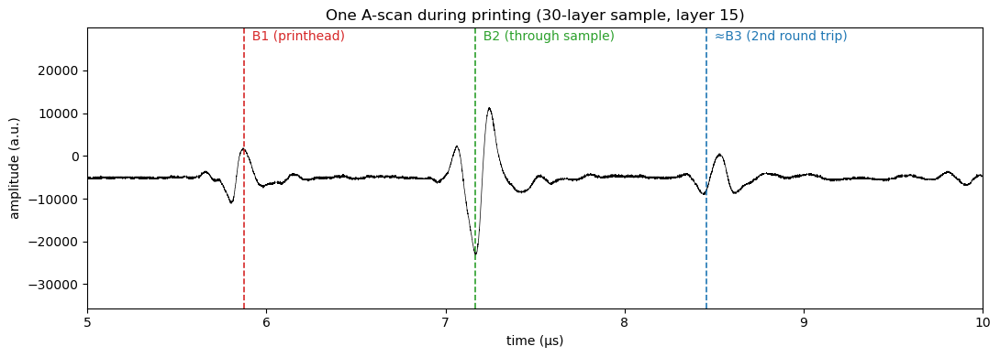

ToF(B1→B2) = 1.294 µs


In [3]:
# Track B1/B2 through the whole 30-layer print. The tracker locates B1 inside a
# fixed index window (the printhead round trip never changes) and then follows
# B2 forward layer by layer, allowing it to advance by at most ~800 samples per
# layer so that it can never jump onto the later, weaker B3 echo.
track30 = iu.track_sample(wf_30)

x = wf_30[14, -1]                       # layer 15 (0-based index 14), final frame
b1 = int(track30.b1_idx[14])            # tracked B1 position, in sample index
b2 = int(track30.b2_idx[14])            # tracked B2 position, in sample index
b3_approx = b1 + 2 * (b2 - b1)          # B3 = the same trip made twice

fig, ax = plt.subplots(figsize=(11, 4))
ax.plot(t_us, x, lw=0.5, color="k")
for idx, name, c in [(b1, "B1 (printhead)", "tab:red"),
                     (b2, "B2 (through sample)", "tab:green"),
                     (b3_approx, "≈B3 (2nd round trip)", "tab:blue")]:
    ax.axvline(t_us[idx], color=c, ls="--", lw=1.2)
    ax.text(t_us[idx], ax.get_ylim()[1]*0.9, "  " + name, color=c, fontsize=10)
# Zoom to 5-10 us: everything before 5 us is the transmit pulse ringing down.
ax.set(xlim=(5, 10), xlabel="time (µs)", ylabel="amplitude (a.u.)",
       title="One A-scan during printing (30-layer sample, layer 15)")
plt.tight_layout(); plt.show()

# Index difference -> nanoseconds (0.4 ns per sample) -> microseconds.
tof_us = (b2 - b1) * iu.DT_NS / 1000
print(f"ToF(B1→B2) = {tof_us:.3f} µs")


## 3. The classic waterfall — 30 layers stacked

Plot each layer's final waveform with a vertical offset. **B1 stays put; B2
marches right** as the part grows ~100 µm per layer.

---

**Input** — `wf_30` again (one trace per layer: the *final* frame, i.e. the end
of that layer's exposure) together with the tracked positions in `track30`.

**What this cell does** — draws all 30 traces in one axes, each shifted upward
by its layer number so they do not overlap, and overlays the two tracked echo
positions as connected markers. Two small tricks make the plot readable: we zoom
to the index range that actually contains the echoes, and we subtract each
trace's baseline before scaling it.

**Output** — one static figure. Read it as a picture of the whole print: the
vertical red line is the unchanged printhead echo, the green diagonal is the
part growing.


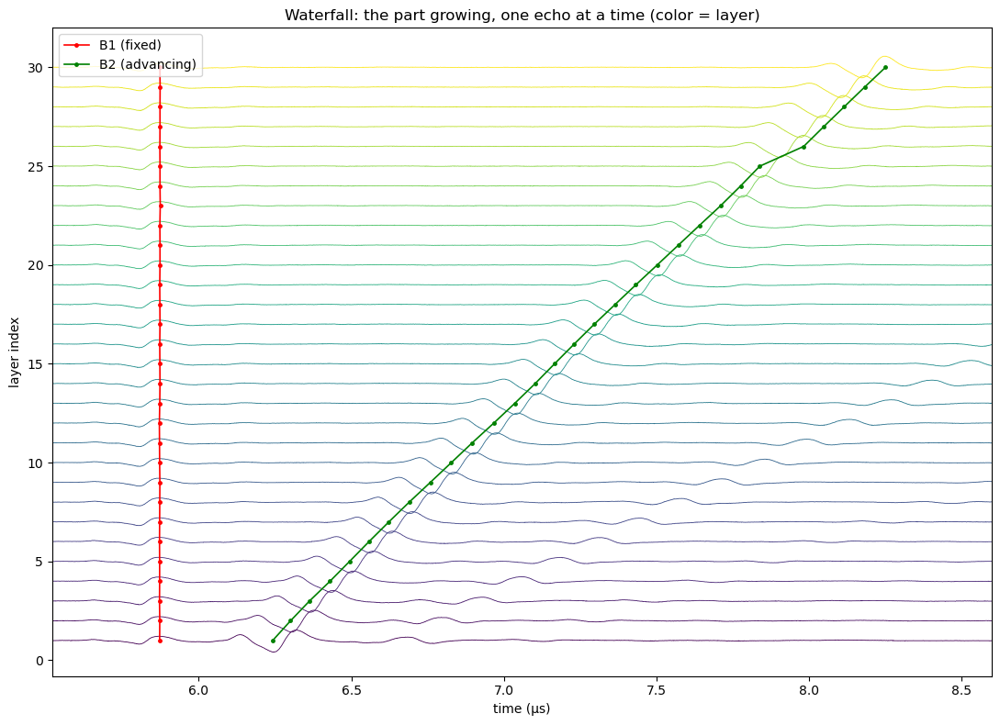

In [4]:
fig, ax = plt.subplots(figsize=(11, 8))
# Zoom to the echo region (index 13800-21500 ≈ 5.5-8.6 µs) and keep every 3rd
# point — plotting all 62509 points × 30 layers would be slow and unreadable.
sl = slice(13800, 21500, 3)
for li in range(wf_30.shape[0]):
    x = wf_30[li, -1, sl].astype(float)
    x = x - np.median(x)                         # remove the DC baseline offset
    # Divide by a typical peak amplitude (~3.2e4) so one trace spans about one
    # unit, then shift it up by its layer number: that is the "waterfall" trick.
    ax.plot(t_us[sl], x / 3.2e4 + li + 1, lw=0.6,
            color=plt.cm.viridis(li / (wf_30.shape[0] - 1)))   # color = layer
ax.plot(t_us[track30.b1_idx], track30.layer, "r.-", ms=5, lw=1.2, label="B1 (fixed)")
ax.plot(t_us[track30.b2_idx], track30.layer, "g.-", ms=5, lw=1.2, label="B2 (advancing)")
ax.set(xlim=(t_us[sl][0], t_us[sl][-1]), ylim=(-0.8, wf_30.shape[0] + 2),
       xlabel="time (µs)", ylabel="layer index",
       title="Waterfall: the part growing, one echo at a time (color = layer)")
ax.legend(loc="upper left"); plt.tight_layout(); plt.show()


### Interactive 3D waterfall (rotate me!)

The same data as a rotatable 3D figure (plotly). Drag to rotate, scroll to zoom
— and **double-click to snap back to the starting view** at any time.

The starting camera is fixed on purpose, so that everyone in the class begins
from the same, readable orientation:

- **x = time (µs)**, increasing **left → right**, same direction as every other
  plot in this notebook;
- **y = layer index**, increasing into the depth of the scene — the front row is
  layer 1, the back row is layer 30;
- **z = amplitude**, vertical.

---

**Input** — identical to the previous cell (`wf_30` + `track30`); only the
rendering changes.

**What this cell does** — builds one 3D line per layer with plotly, using time
as x, layer index as y and amplitude as z, and adds the tracked B2 path as a
green 3D curve so you can see the echo front sweeping through the stack. It
then pins the camera: plotly's default viewpoint sits at `eye = (1.25, 1.25,
1.25)`, which makes the time axis run *right to left* on screen; a negative
`eye.y` flips it back to the natural left-to-right reading order.

**Output** — an interactive plotly figure. It works in Colab and in a live
Jupyter kernel; in a plain static export of the notebook it may appear blank,
which is normal.


In [5]:
import plotly.graph_objects as go

figly = go.Figure()
# Coarser decimation than the 2D plot (every 8th point) — 3D rendering in the
# browser is much heavier than a static image.
sl = slice(12000, 24000, 8)
for li in range(wf_30.shape[0]):
    x = wf_30[li, -1, sl]
    figly.add_trace(go.Scatter3d(
        x=t_us[sl], y=np.full(len(x), li + 1), z=x,      # time, layer, amplitude
        mode="lines", line=dict(color="black", width=1.2), showlegend=False))
# The tracked B2 path, drawn at the amplitude the waveform actually has there.
figly.add_trace(go.Scatter3d(
    x=t_us[track30.b2_idx], y=track30.layer,
    z=[wf_30[li, -1, b] for li, b in enumerate(track30.b2_idx)],
    mode="lines+markers", line=dict(color="green", width=4),
    marker=dict(size=3), name="B2 track"))
# Fix the starting viewpoint so the figure always opens the same way.
# Screen-right direction is proportional to (-eye.y, eye.x, 0): plotly's default
# eye = (1.25, 1.25, 1.25) therefore makes TIME run right-to-left. A negative
# eye.y restores the normal left-to-right reading order, and the explicit
# ascending ranges make the axis directions unambiguous.
figly.update_layout(
    scene=dict(
        xaxis=dict(title="time (µs)  →", range=[t_us[sl][0], t_us[sl][-1]]),
        yaxis=dict(title="layer (1 = front)", range=[0, wf_30.shape[0] + 1]),
        zaxis=dict(title="amplitude (a.u.)"),
        camera=dict(eye=dict(x=-0.6, y=-2.0, z=0.8),   # viewer in front, slightly left
                    up=dict(x=0, y=0, z=1)),           # keep z vertical
        aspectmode="manual", aspectratio=dict(x=1.7, y=1.1, z=0.5)),
    height=560, margin=dict(l=0, r=0, t=30, b=0),
    title="30-layer print — interactive waterfall (double-click to reset the view)")
figly.show()


## 4. Watch the part grow — waveform animation

Now the same story as a movie: one frame per layer, with the tracked B1/B2
markers and a live ToF readout. (This is the visual proof that the acoustic
path grows layer by layer.)

---

**Input** — `wf_30` (final frame of each layer) and `track30`. The animation has
one movie frame per **printed layer**, so it runs for 30 frames.

**What this cell does** — creates an empty axes once, then a small `update()`
function redraws the waveform and moves the two markers for each layer.
Matplotlib's `FuncAnimation` calls that function repeatedly; because we set
`rc("animation", html="jshtml")` in the setup cell, the result is embedded as a
video player with play/pause controls.

**Output** — an interactive animation player. `plt.close(fig)` before returning
`ani` simply prevents Jupyter from *also* showing the static first frame.


In [6]:
from matplotlib.animation import FuncAnimation

sl = slice(12000, 24000, 6)               # echo region, decimated for speed
fig, ax = plt.subplots(figsize=(10, 4))
# Create the artists ONCE; the animation only updates their data (much faster
# than redrawing a whole figure per frame).
line, = ax.plot([], [], lw=0.6, color="k")
vb1 = ax.axvline(0, color="tab:red", ls="--", lw=1.2)      # B1 marker
vb2 = ax.axvline(0, color="tab:green", ls="--", lw=1.2)    # B2 marker
txt = ax.text(0.02, 0.92, "", transform=ax.transAxes, fontsize=12)
# Fixed axis limits: if they moved from frame to frame the growth would be
# impossible to see.
ax.set(xlim=(t_us[sl][0], t_us[sl][-1]), ylim=(-4e4, 4e4),
       xlabel="time (µs)", ylabel="amplitude",
       title="30-layer print — layer-by-layer echo evolution")

def update(li):
    """Draw layer li+1: waveform, tracked markers, and the live ToF readout."""
    line.set_data(t_us[sl], wf_30[li, -1, sl])
    r = track30.iloc[li]
    vb1.set_xdata([t_us[int(r.b1_idx)]]); vb2.set_xdata([t_us[int(r.b2_idx)]])
    txt.set_text(f"layer {li+1:2d}/30    ToF = {r.tof_us:.3f} µs")
    return line, vb1, vb2, txt

ani = FuncAnimation(fig, update, frames=wf_30.shape[0], interval=280, blit=False)
plt.close(fig)     # hide the static figure; show only the player below
ani


### The race: weak cure (I1) vs strong cure (I7)

Two 15-layer prints, same geometry, different exposure intensity — side by side.
Because the two prints are identical in every respect except the light dose,
**everything that differs between the two panels is caused by curing alone.**
There are two distinct effects to watch, and they are the two independent ways
in which the echo carries material information:

**① The echo arrives earlier — B2 shifts left.** Curing crosslinks the resin
into a stiffer network, and a stiffer material carries sound *faster*. At the
same layer index the acoustic path has the same length in both panels, so the
strongly cured sample (I7) returns its echo sooner: its green marker sits to
the left of the weakly cured one. This is a **velocity** effect, and it is what
the ToF feature measures.

**② The echo comes back weaker — the peak amplitude decays more.** Watch the
*height* of the burst at the green marker, not just its position. The higher
exposure intensity produces a denser, more crosslinked network, which absorbs
and scatters more ultrasonic energy. The weakly cured print returns the stronger
echo at *every* layer, and — this is the part to watch — **the gap widens as the
part grows**: the two bursts differ by roughly 1.5× at the first layer but by
more than 5× around layer 9, because every added layer of strongly cured
material takes another bite out of the echo. Both panels use the same vertical
scale, so this comparison is a fair one. It is an **attenuation** effect, and it
is what the B2/B1 amplitude-ratio feature measures in Notebook 2.

> So the same echo carries at least three competing influences: **thickness
> moves B2 right, cure moves it left, and cure also pulls its amplitude down.**
> One measurement, several causes — untangling them is exactly what the
> machine-learning part of this series has to do, and it is why Notebook 2
> designs *several* complementary features instead of relying on ToF alone.

---

**Input** — the controlled pair `wf_i1` (I1, weak cure) and `wf_i7` (I7, strong
cure): same 15-layer geometry, same resin, only the exposure intensity differs.

**What this cell does** — tracks the echoes of both prints (giving `track_i1`
and `track_i7`, reused in section 6 and in Notebook 2), then animates them in
two side-by-side panels that advance layer-synchronously, so any difference you
see is caused by the light dose alone.

**Output** — a two-panel animation plus the two tracking tables.


In [7]:
# Track the echoes of the controlled pair (same geometry, different intensity).
track_i1 = iu.track_sample(wf_i1)
track_i7 = iu.track_sample(wf_i7)

sl = slice(13500, 20000, 6)
fig, axes = plt.subplots(1, 2, figsize=(12, 3.6), sharey=True)
arts = []
# Build the same set of artists (line + two markers + text) for each panel and
# remember them, so that update2() can refresh both panels together.
for ax, name in zip(axes, ["I1 = 10.70 mW/cm² (weak)", "I7 = 20.16 mW/cm² (strong)"]):
    ln, = ax.plot([], [], lw=0.6, color="k")
    v1 = ax.axvline(0, color="tab:red", ls="--", lw=1.1)
    v2 = ax.axvline(0, color="tab:green", ls="--", lw=1.4)
    tx = ax.text(0.03, 0.9, "", transform=ax.transAxes, fontsize=11)
    # Identical limits on both panels — otherwise the comparison would be unfair.
    ax.set(xlim=(t_us[sl][0], t_us[sl][-1]), ylim=(-4e4, 4e4),
           xlabel="time (µs)", title=name)
    arts.append((ln, v1, v2, tx))
axes[0].set_ylabel("amplitude")

def update2(li):
    """Advance BOTH prints to the same layer index li+1."""
    out = []
    for (ln, v1, v2, tx), wf, tr in [(arts[0], wf_i1, track_i1),
                                     (arts[1], wf_i7, track_i7)]:
        ln.set_data(t_us[sl], wf[li, -1, sl])
        r = tr.iloc[li]
        v1.set_xdata([t_us[int(r.b1_idx)]]); v2.set_xdata([t_us[int(r.b2_idx)]])
        tx.set_text(f"layer {li+1}   ToF {r.tof_us:.3f} µs")
        out += [ln, v1, v2, tx]
    return out

ani2 = FuncAnimation(fig, update2, frames=wf_i1.shape[0], interval=380, blit=False)
plt.close(fig)
ani2


## 5. Explore for yourself — interactive waveform browser

Use the sliders to pick a sample, a layer, and a frame. (On Colab the widgets
are live; in a static render you see one snapshot.)

**The two sliders are not interchangeable — they move along the two different
time scales of this experiment, and this is the single most important idea in
the whole series.** It is worth spending a few minutes here before moving on.

**Moving the `layer` slider = the across-layer scale (minutes).** Each step is
a whole new layer: the part is ~100 µm taller, and the acoustic path is
physically longer. Watch the **green B2 marker travel to
the right** — that is the part growing. Its amplitude also drifts as the beam
crosses more and more cured material. Because both geometry *and* material
change from one layer to the next, whatever you see here mixes the two.

**Moving the `frame` slider = the within-layer scale (seconds).** Now stay on
one layer and step through its 6 frames: frame 1 is the reference taken before
the light turns on, frames 2–6 are taken every 3 s during the 15 s exposure.
The printhead has not moved and no resin has been added, so **the acoustic path
is frozen** — the geometry is literally constant. Anything that changes here
can only come from the resin crosslinking: mostly a **decay of the peak
amplitude** and a slight change of the burst's shape as the network stiffens
and absorbs more. Notice that the red and green markers stay put while you do
this, which is the visual statement that the window is fixed.

The change within a layer is subtle to the eye — much smaller than what the
layer slider does. That is expected, and it is exactly why Notebook 2 stops
looking and starts *measuring* it, with frame-to-frame RMS and standard
deviation. The payoff is worth the effort: because the geometry cannot change
within a layer, those within-layer numbers are a **geometry-immune probe of
curing** — the cleanest route we have to the degree of conversion.

---

**Input** — all three prints and their tracking tables, collected into the
`SAMPLES` dictionary, so you can switch freely between the weak-cure and
strong-cure prints at the same layer.

**What this cell does** — defines a plotting function `browse()` whose arguments
become widget controls, and hands it to `ipywidgets.interact`, which builds a
dropdown plus two sliders automatically and re-runs the function on every change.
The B1/B2 markers it draws come from the tracking table, which was computed on
each layer's final frame — that is why they do not move when you change frames.

**Output** — an interactive browser. Two things worth trying: hold the layer
fixed and switch between I1 and I7 to see the cure difference, then hold the
sample fixed and sweep the layer slider to see the growth.


In [8]:
import ipywidgets as w

# One entry per print: (waveform array, tracking table).
SAMPLES = {"15 layers, I1": (wf_i1, track_i1),
           "15 layers, I7": (wf_i7, track_i7),
           "30 layers, I7": (wf_30, track30)}

def browse(sample="30 layers, I7", layer=1, frame=6):
    """Plot one A-scan chosen by the widgets (layer and frame are 1-based)."""
    wf, tr = SAMPLES[sample]
    layer = min(layer, wf.shape[0])     # the 15-layer prints have no layer 16-30
    x = wf[layer - 1, frame - 1]        # widgets count from 1, Python from 0
    r = tr.iloc[layer - 1]
    fig, ax = plt.subplots(figsize=(10, 3.4))
    ax.plot(t_us[::4], x[::4], lw=0.5, color="k")   # every 4th point: fast redraw
    ax.axvline(t_us[int(r.b1_idx)], color="tab:red", ls="--", label="B1")
    ax.axvline(t_us[int(r.b2_idx)], color="tab:green", ls="--", label="B2")
    ax.set(xlim=(5, 10), xlabel="time (µs)", ylabel="amplitude",
           title=f"{sample} — layer {layer}, frame {frame}  |  ToF = {r.tof_us:.3f} µs")
    ax.legend(loc="upper right"); plt.tight_layout(); plt.show()

# interact() inspects browse()'s arguments and builds the matching controls:
# a dropdown for `sample`, sliders for `layer` and `frame`.
w.interact(browse, sample=list(SAMPLES), layer=(1, 30, 1), frame=(1, 6, 1));


interactive(children=(Dropdown(description='sample', index=2, options=('15 layers, I1', '15 layers, I7', '30 l…

## 6. First quantitative result: ToF vs layer

The simplest possible "monitor": track ToF layer by layer. It is nearly linear
(path grows ~100 µm/layer), and the *slope difference* between I1 and I7 already
carries material information (velocity).

---

**Input** — the two tracking tables of the controlled pair, `track_i1` and
`track_i7`. The raw waveforms are no longer needed: we have compressed 62,509
points per frame down to **one number per layer**.

We deliberately plot *only* the two 15-layer prints here. The 30-layer sample
is a different build — more layers means more accumulated exposure, a taller
part and a longer print time — so putting its curve on the same axes would
compare two things at once and nothing could be attributed cleanly. The I1/I7
pair, in contrast, differs in **exactly one** variable, the exposure intensity,
so any gap between the two curves is caused by the light dose alone.

**What this cell does** — plots `tof_us` against layer index for the two prints
on common axes.

**Output** — the first real "process monitoring" curve of the series: a physical
quantity measured *during* printing, without touching the part. Both curves rise
with the same overall geometry-driven trend, and the strongly cured print sits
slightly lower because its waves travel faster.


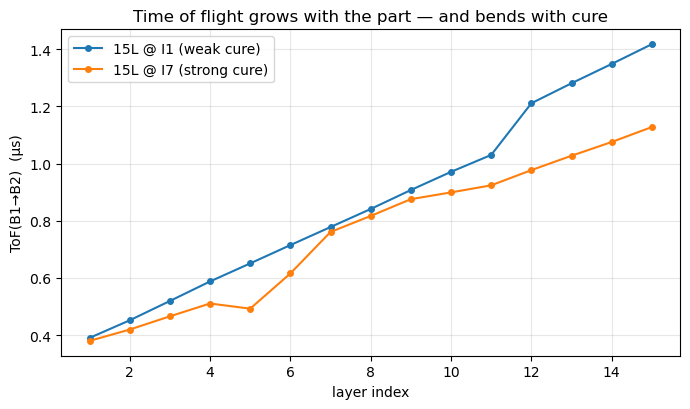

In [9]:
fig, ax = plt.subplots(figsize=(7, 4.2))
# Each tracking table already contains tof_us per layer — one number per layer
# distilled from 6 x 62509 raw points.
# Only the controlled pair is plotted: same 15-layer geometry, only the exposure
# intensity differs, so the gap between the curves is attributable to cure alone.
for tr, name, c in [(track_i1, "15L @ I1 (weak cure)", "tab:blue"),
                    (track_i7, "15L @ I7 (strong cure)", "tab:orange")]:
    ax.plot(tr.layer, tr.tof_us, "o-", ms=4, color=c, label=name)
ax.set(xlabel="layer index", ylabel="ToF(B1→B2)  (µs)",
       title="Time of flight grows with the part — and bends with cure")
ax.legend(); ax.grid(alpha=0.3); plt.tight_layout(); plt.show()


## Exercises

1. Zoom the waterfall into layers 1–3 of the I1 sample. Why is B2 hard to
   separate from B1 for very thin parts? What does this imply for monitoring
   the first layers of any print?
2. Using `track30`, estimate the average ToF increment per layer, and — assuming
   a 100 µm layer thickness — compute the effective sound speed in the part.
   Compare it with water (~1.48 mm/µs). *(hint: ToF is a round trip.)*
3. In the race animation, the I1 sample's B2 amplitude stays higher than I7's
   throughout the print, and the gap widens with depth. Offer a physical
   explanation (think attenuation per unit of cured path).

**Next notebook:** we turn these observations into *features* — designed on a
two-scale physical framework.
